In [ ]:
import torch  # to use PyTorch (optimized tensor library for deep learning using GPU and CPU)
from torch import nn  #module torch. nn: diff classes, help  build nns
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split #split data into train and test
import torch.optim as optim
import numpy as np   # NumPy: Python library used for working w/arrays
                     #np.arrange, np.random.shuffle
import pandas as pd  #pandas: software library for data manipulation + analysis
                     #pd.read.csv   
from sklearn.metrics import r2_score #calculate r-square
import matplotlib.pyplot as plt  #graph function



In [ ]:
torch.cuda.is_available()
from google.colab import drive   #importing drive
drive.mount('/content/drive')   
 

Mounted at /content/drive


In [ ]:
#download the data from google drive to colab  
! gdown --id 1WJVQOxcO1b4jAPlAnh1lW_X_6umiJxI4
df1 = pd.read_csv("parameters.csv",header=None)
print(df1.head()) #gives first 5 rows
print(df1.shape) #prints number of rows
 
! gdown --id 1sEeaqVBY3MbprkO4ETh_BNNyWTdqYemB
df2 = pd.read_csv("real_t.csv",header=None)
print(df2.head()) #gives first 5 rows
print(df2.shape) #prints number of rows
 
! gdown --id 1-MBXyYXVnc06E0UrE1JtIXm-zB6IkLxw
df3 = pd.read_csv("imag_t.csv",header=None)
print(df3.head()) #gives first 5 rows
print(df3.shape) #prints number of rows

#full x data from parameters.csv, containing 4 parameters: permittivity, gap, thickness and radius
# range of parameters: permittivity (12,25), gap (0.1, 1.55), thickness (0.5, 1.55), radius (0.1, 1.05)
x_full=torch.tensor(df1.iloc[0:len(df1)].values).float().cuda()  
real_full=torch.tensor(df2.iloc[0:len(df2)].values).float().cuda()   #real part data from real_t
imag_full=torch.tensor(df3.iloc[0:len(df3)].values).float().cuda()   #image part data from imag_t
amplitude_full = torch.sqrt(torch.mul(real_full, real_full) +torch.mul(imag_full, imag_full)) # amplitude from real and image data  


/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1WJVQOxcO1b4jAPlAnh1lW_X_6umiJxI4
To: /content/parameters.csv
100% 1.41M/1.41M [00:00<00:00, 129MB/s]
       0     1     2     3
0  22.01  0.72  1.21  0.61
1  19.77  0.14  1.29  0.95
2  24.64  1.32  1.21  0.66
3  24.55  0.87  1.42  0.99
4  21.79  0.51  1.26  0.76
(65611, 4)
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1sEeaqVBY3MbprkO4ETh_BNNyWTdqYemB
To: /content/real_t.csv
100% 228M/228M [00:03<00:00, 68.5MB/s]
        0         1         2         3         4         5         6    \
0

In [ ]:
#separate the data sets into training and test, and create dataloader
# 70% data as training, and 30% data as testing  
dropout_rate = 0.3 
td_ratio = 1-dropout_rate #percent training data
batch_size = 200 #each batch in dataloader contains 200 rows
 
x_train, x_test, real_train, real_test , imag_train, imag_test = train_test_split(x_full,real_full, imag_full, test_size=dropout_rate, random_state=42)
#print real data shapes 
print('full x data shape:',x_full.shape)
print('x train data shape:', x_train.shape)
print('x test data shape:', x_test.shape)
print('real full data shape:',  real_full.shape)
print('real train data shape:', real_train.shape)
print('real test data shape:', real_test.shape)
print('imag full data shape:',  imag_full.shape)
print('imag train data shape:', imag_train.shape)
print('imag test data shape:', imag_test.shape)

#Define our Dataset Class and create dataloader for real and imag
class SpectroData(Dataset):
  def __init__(self, data): #load data and convert to tensors
    self.data = data
  def __getitem__(self, index): #gives data from imported dataset
    return self.data[index] 
  def __len__(self):  #returns length of tensor
    return len(self.data)

#combine train data for realdataloader
train_dataset1= torch.utils.data.TensorDataset(x_train, real_train)   
test_dataset1= torch.utils.data.TensorDataset(x_test, real_test)   
train_dataset_real=SpectroData(train_dataset1)
test_dataset_real=SpectroData(test_dataset1)
#load x_train and real_train together
train_loader_real = torch.utils.data.DataLoader(train_dataset_real, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=False) 
test_loader_real = torch.utils.data.DataLoader(test_dataset_real, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=False) 

#combine train data for imag dataloader
train_dataset2= torch.utils.data.TensorDataset(x_train, imag_train)   
test_dataset2= torch.utils.data.TensorDataset(x_test, imag_test)   
train_dataset_imag=SpectroData(train_dataset2)
test_dataset_imag=SpectroData(test_dataset2)
#load x_train and imag_train together
train_loader_imag = torch.utils.data.DataLoader(train_dataset_imag, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=False) 
test_loader_imag= torch.utils.data.DataLoader(test_dataset_imag, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=False) 

full x data shape: torch.Size([65611, 4])
x train data shape: torch.Size([45927, 4])
x test data shape: torch.Size([19684, 4])
real full data shape: torch.Size([65611, 301])
real train data shape: torch.Size([45927, 301])
real test data shape: torch.Size([19684, 301])
imag full data shape: torch.Size([65611, 301])
imag train data shape: torch.Size([45927, 301])
imag test data shape: torch.Size([19684, 301])


In [ ]:
#define PNN model and load the trained PNN model

#define the bilinear function  
def f(x, W1,W2, V, b): 
  n=len(x) # x is a N*1*4 tensor
  xsq = torch.transpose(torch.mul(x, x),1,0)  #squares x
  xt=torch.transpose(x, 1,0)
  xT_W1 =torch.einsum("mj,ijk",x,W1).permute(0,2,1).cuda()
  xT_W1_x=torch.transpose(torch.diagonal(torch.einsum("ijk,km", xT_W1,xt), offset=0, dim1=1, dim2=2),1,0) #n*50
  xT_W2 =torch.einsum("mj,ijk",x,W2).permute(0,2,1).cuda()
  xT_W2_x=torch.transpose(torch.diagonal(torch.einsum("ijk,km", xT_W2,xsq), offset=0, dim1=1, dim2=2),1,0) #n*50
  V_xcat= torch.transpose(torch.mm(V,torch.cat((xt, xsq))),1,0)
  b1=torch.transpose(b.repeat(1,n),1,0)
  Q= xT_W1_x+xT_W2_x+V_xcat+b1
  return(Q)  

#define the PNN model
class NeuralNetwork(nn.Module):    
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.flatten = nn.Flatten()
        # parameters of bilinear function
        self.params = nn.ParameterDict({
                'W1': nn.Parameter(torch.ones(50, 4, 4).cuda(), requires_grad = True),
                'W2': nn.Parameter(torch.ones(50, 4, 4).cuda(), requires_grad = True),
                'V':  nn.Parameter(torch.ones(50,8).cuda(), requires_grad = True),
                'b':  nn.Parameter(torch.ones(50,1).cuda(), requires_grad = True)
        })   
        self.linear_relu_stack = nn.Sequential(   #nn.Sequential -> output of each layer as input of next layer
            nn.ReLU(),  #ReLU: activation function (defines output/what goes into next layer)
            nn.Linear(50, 500), # creates single layer feed forward network with 50 inputs and 500 outputs
            nn.ReLU(),
            nn.Linear(500, 500),
            nn.ReLU(),
            nn.Linear(500, 500),
            nn.ReLU(),
            nn.Linear(500, 301),
        )
     
    def forward(self, x): #def forward function
       Q=f(x, self.params['W1'],self.params['W2'],self.params['V'], self.params['b'])
       logits = self.linear_relu_stack(Q)
       return logits

PNN_real = NeuralNetwork().cuda()    #define model

#define save function to save checkpoint 
# after each iteration, the trained model, and results are saved, and will be loaded in the next iteration 
import shutil
def save_ckp(state, checkpoint_path):
    f_path = checkpoint_path
    torch.save(state, f_path)
    
def load_ckp(checkpoint_fpath, model, optimizer):
    checkpoint = torch.load(checkpoint_fpath)
    model.load_state_dict(checkpoint['state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
  #  valid_loss_min = checkpoint['valid_loss_min']
    return model, optimizer, checkpoint['epoch'], checkpoint['Rsquare'],  checkpoint['TRAIN_LOSS'], checkpoint['TEST_LOSS'],checkpoint['inx']


 
 

In [ ]:
 #define the function to train the model using real train data
def PNN_real_train(start_epoch, num_epoch, model, optimizer, checkpoint_path):
 
    for epoch in range(start_epoch, num_epoch+start_epoch):
       
        PNN_real.train()
        for batch_idx, (x_train_batch, y_train_batch) in enumerate(train_loader_real):
            #optimizer.zero_grad()   #optimize after each batch
            #x_train_batch, y_train_batch =(Variable(x_train_batch),Variable(y_train_batch))
            y_pred_batch = PNN_real(x_train_batch)
            #combine all y_pred_batch into y_pred
            if batch_idx==0: y_pred_train=  y_pred_batch
            else:            y_pred_train = torch.cat((y_pred_train, y_pred_batch),0)
            loss =loss_func(y_train_batch, y_pred_batch) #MSE loss
            PNN_real.zero_grad() #sets the gradients of all its parameters to zero
            loss.backward(retain_graph=True) #computes dloss/dx for every parameter x which has requires_grad=True
            optimizer.step() #updates the value of parameter x using the gradient  
         
        loss_train =loss_func(y_pred_train, real_train.cuda()) # calculate loss of train data for each epoch
        Trainloss.append(loss_train.item())  # record train loss for each epoch
        
        PNN_real.eval() #not optimize, for each epoch: test loss
        with torch.no_grad(): # stop updating the parameters
          for batch_idx, (x_test_batch, y_test_batch) in enumerate(test_loader_real):
              x_test_batch, y_test_batch =(Variable(x_test_batch),Variable(y_test_batch))
              y_pred_batch = PNN_real(x_test_batch)
              if batch_idx==0: 
                  y_pred_test=  y_pred_batch
              else:
                  y_pred_test = torch.cat((y_pred_test, y_pred_batch),0)
          loss_test = loss_func(y_pred_test,real_test.cuda())
          Testloss.append(loss_test.item()) # record test loss for each epoch
  
        indices.append(epoch+1)    #record epoch

        #calculate and record R-square
        y_train1=real_train.reshape(len(real_train),301).cuda()
        y_train2 = y_train1.detach().cuda()
        y_pred1=y_pred_train.reshape(len(real_train),301)
        y_pred2 = y_pred1.detach()
        r2=r2_score(y_train2.cpu(), y_pred2.cpu())  #y_train2: real_train, y_pred2: y_pred
        r_squared.append(r2)

        # print loss and r-square every 100 iterations 
        if epoch%100==1 or epoch==num_epoch+start_epoch-1 : 
          #print("learning rate", lr)
          print('epoch', epoch)
          print("TRAIN_LOSS", Trainloss[-5:])
          print("TEST_LOSS",Testloss[-5:])
          print("Rsquare",r_squared[-5:])
        #save training outputs into the checkpoint
        checkpoint = {
            'epoch': epoch + 1,
            'Rsquare': r_squared,
            'TRAIN_LOSS': Trainloss,
            'TEST_LOSS': Testloss,
            'inx':indices,
            #'valid_loss_min': valid_loss,
            'state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
        }

        #save the model 
        if epoch%100==1 or epoch==num_epoch+start_epoch-1: save_ckp(checkpoint, current_checkpoint_PNN_real) # save the model checkpoint every 100 iterations
        
    return PNN_real

In [ ]:
#before training the model
from torch.autograd import Variable  # Variable wraps tensor, gives way to perform backpropagation
lr = 1e-05 #learning rate
loss_func=nn.MSELoss()  #define loss function
optimizer = optim.Adam(PNN_real.parameters(), lr = lr) # use Adam optimizer for model training
#path for saving trained model
current_checkpoint_PNN_real="/content/drive/MyDrive/current_checkpoint_PNN_real.pth" 


In [ ]:
#initiate the training
#DONT RUN this cell if you want to continue the contraining.
#If this is the first time of training, start_epoch=1, otherwise go to the next cell
start_epoch=1
if (start_epoch==1):
    Trainloss=[] # loss of every epoch in iteration for training data
    Testloss = [] #loss of every epoch in iteration for test data
    r_squared = []
    indices = []  #epochs
    num_epoch=1
    trained_model = PNN_real_train(start_epoch, num_epoch, PNN_real, optimizer, current_checkpoint_PNN_real) #train the model and save the checkpoint
 
 

In [ ]:
#load the trained model and continue the training 
PNN_real, optimizer, start_epoch, r_squared,Trainloss,Testloss,indices = load_ckp(current_checkpoint_PNN_real, PNN_real, optimizer)
num_epoch=30000
import time
start = time.time()
trained_model = PNN_real_train(start_epoch, num_epoch, PNN_real, optimizer, current_checkpoint_PNN_real) #train the model and save the checkpoint
end = time.time()
print("running time for PNN_real", end - start)


epoch 30101
TRAIN_LOSS [0.0020888615399599075, 0.002057417528703809, 0.0021852776408195496, 0.002103192266076803, 0.002087849425151944]
TEST_LOSS [0.002085550455376506, 0.002110484754666686, 0.0021838226821273565, 0.0022126375697553158, 0.0021865679882466793]
Rsquare [0.986411726646204, 0.9866169001015258, 0.9857879638157139, 0.9863230803361608, 0.9864223771226804]
epoch 30201
TRAIN_LOSS [0.002093109069392085, 0.0020472740288823843, 0.0020260175224393606, 0.0020639568101614714, 0.002055891789495945]
TEST_LOSS [0.0021401268895715475, 0.002006524708122015, 0.002023849869146943, 0.0021176727022975683, 0.002050505019724369]
Rsquare [0.9863845055889194, 0.9866827601937518, 0.9868226101881483, 0.9865759879545389, 0.9866259587230986]
epoch 30301
TRAIN_LOSS [0.0021557870786637068, 0.0020771219860762358, 0.0020628906786441803, 0.002044346183538437, 0.0020819895435124636]
TEST_LOSS [0.002240094356238842, 0.0021639547776430845, 0.002199136419221759, 0.002225118689239025, 0.0021627137903124094]
Rs

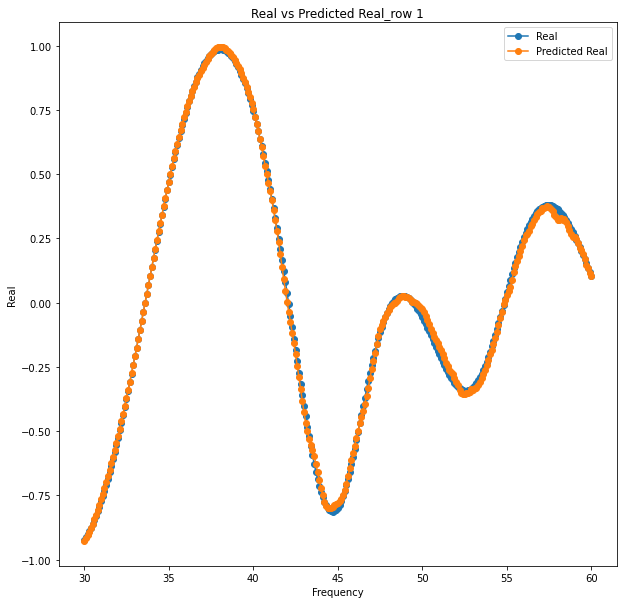

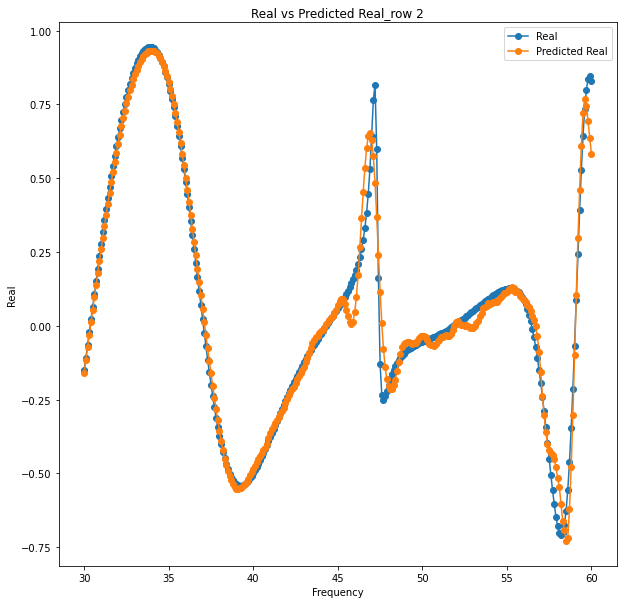

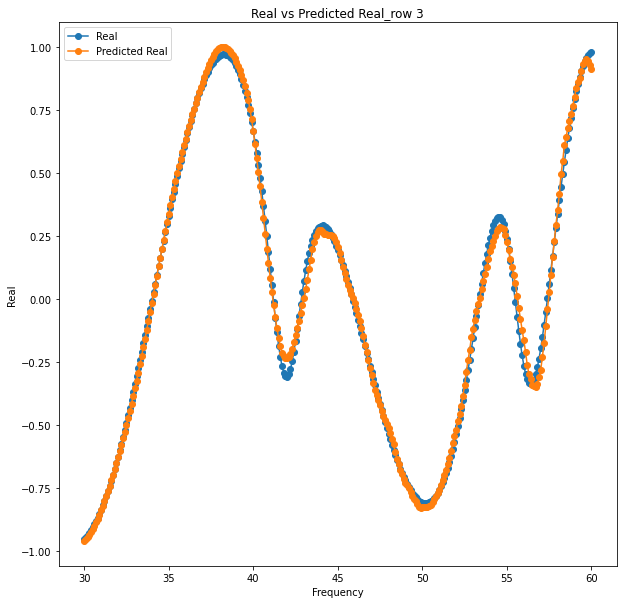

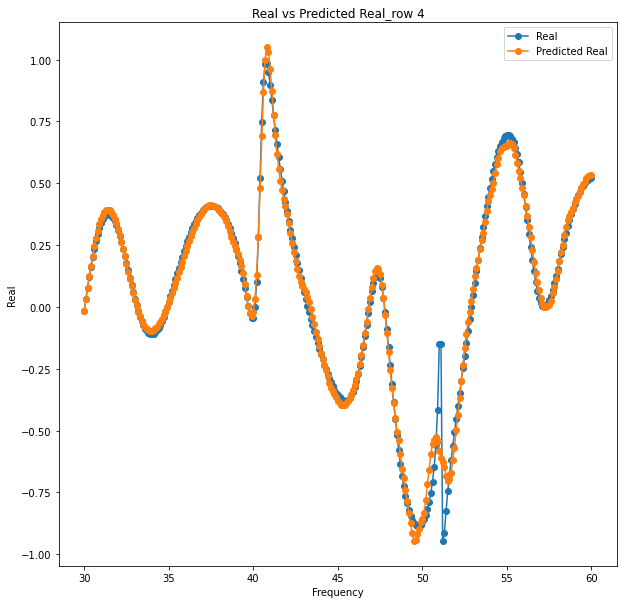

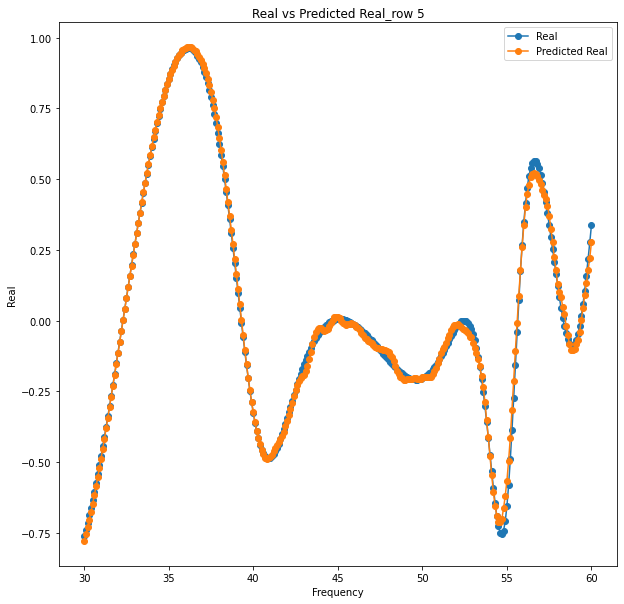

...

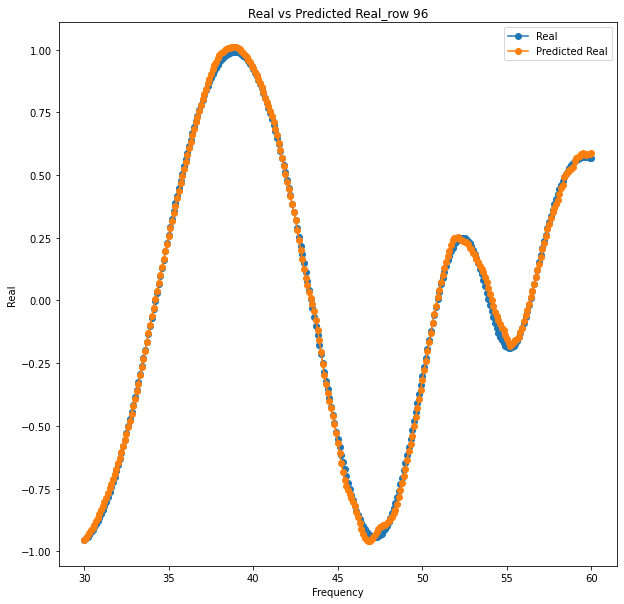

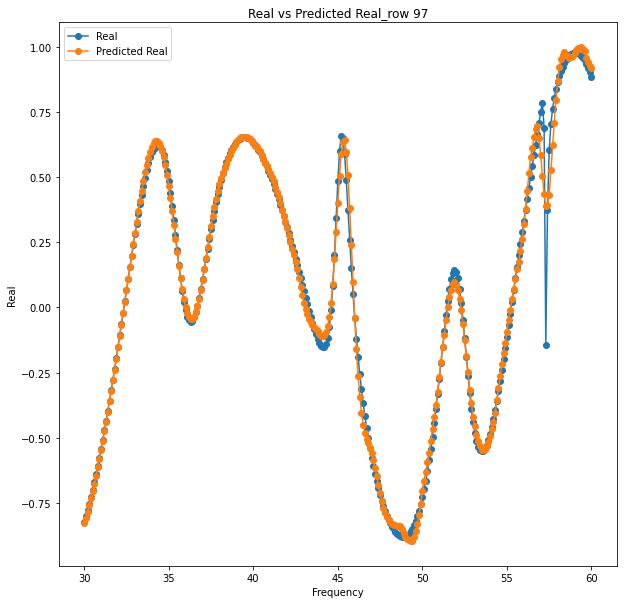

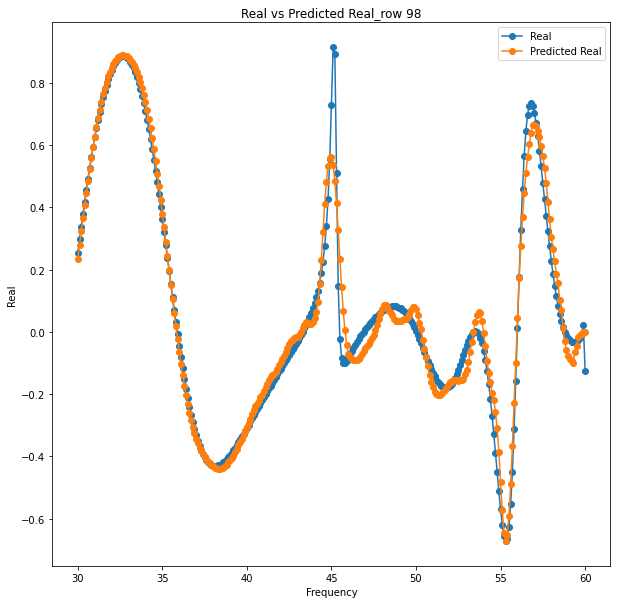

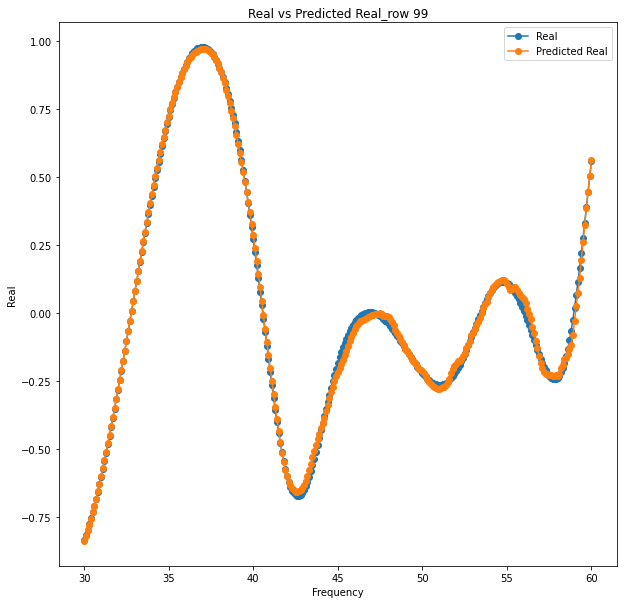

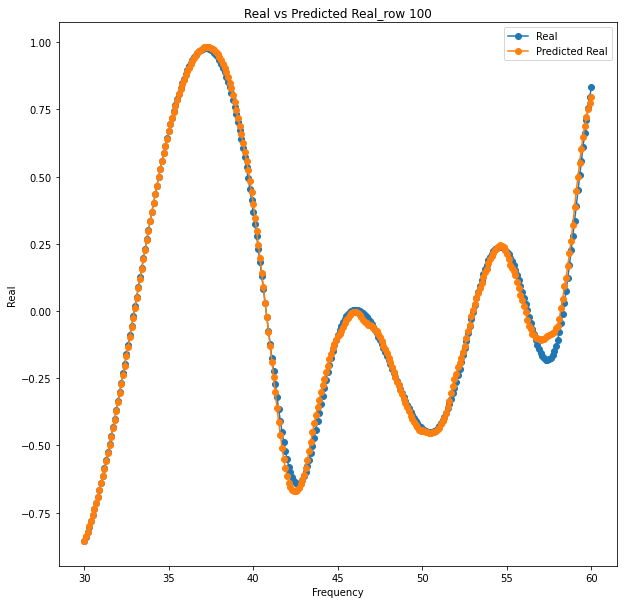

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# create dataloader for parameter and the whole real data

dataset1= torch.utils.data.TensorDataset(x_full, real_full)   
dataset_real=SpectroData(dataset1)
dataloader_real = torch.utils.data.DataLoader(dataset_real, batch_size=200, shuffle=False, num_workers=0, pin_memory=False) 

#load trained model
PNN_real, optimizer, start_epoch, r_squared_real,Trainloss_real,Testloss_real,indices_real = load_ckp(current_checkpoint_PNN_real, PNN_real, optimizer)
PNN_real.eval() #not optimize, evaluate the trained model
with torch.no_grad(): # stop updating the parameters
     for batch_idx, (x_batch, y_batch) in enumerate(dataloader_real):
         y_pred_batch = PNN_real(x_batch)
          #combine all y_pred_batch into pred_real
         if batch_idx==0: 
            pred_real=y_pred_batch
         else:
            pred_real= torch.cat((pred_real, y_pred_batch),0)
pred_real_np=pred_real.cpu().numpy() #convert to numpy
real_full_np=real_full.cpu().numpy()


#plot Real vs Predicted Real
#save the first 100 plots into one pdf file
from matplotlib.backends.backend_pdf import PdfPages
from google.colab import files
k=100  
frequency=np.arange(30, 60.1, 0.1) 
pdf = PdfPages('Real vs Predicted Real_first 100 rows.pdf')
for i in range(100): 
        fig, ax = plt.subplots(figsize=(10, 10))
        plt.plot(frequency,real_full_np[i,], '-o')  # the ith row of all real data
        plt.plot(frequency,pred_real_np[i,], '-o')# the ith row of the predicted real data
        plt.xlabel('Frequency')
        plt.ylabel('Real')
        plt.legend(['Real','Predicted Real'])
        plt.title('Real vs Predicted Real_row %i'%(i+1))
        pdf.savefig(fig)
        plt.show()

files.download("Real vs Predicted Real_first 100 rows.pdf") 

pdf.close()


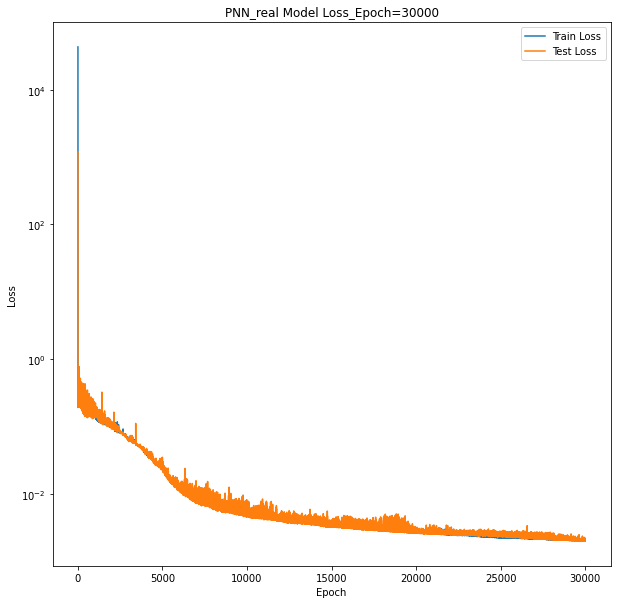

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#plot the model loss
from matplotlib.backends.backend_pdf import PdfPages
from google.colab import files
pdf = PdfPages('PNN_real Model Loss.pdf')
fig, ax = plt.subplots(figsize=(10, 10))
plt.yscale('log') #change the y-axis  scale to logarithmic
k=30000 # plot Model loss until kth iteration
plt.plot(Trainloss[0:k])
plt.plot(Testloss[0:k])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train Loss','Test Loss'])
plt.title('PNN_real Model Loss_Epoch=%i'%k )
#plt.savefig("Model Loss_Epoch="+str(k)+ ".png")
pdf.savefig(fig)
plt.show()
files.download("PNN_real Model Loss.pdf") 
pdf.close()

 

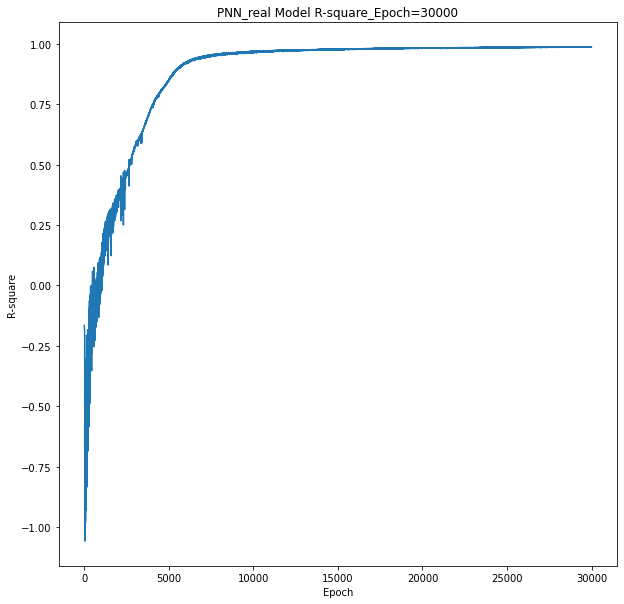

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#plot the model r-square
from matplotlib.backends.backend_pdf import PdfPages
from google.colab import files
pdf = PdfPages('PNN_real Model R-square.pdf')
fig, ax = plt.subplots(figsize=(10, 10))
k=30000 # plot Model loss until kth iteration
plt.plot(r_squared[10:k])
plt.xlabel('Epoch')
plt.ylabel('R-square')
plt.title('PNN_real Model R-square_Epoch=%i'%k )
#plt.savefig("Model Loss_Epoch="+str(k)+ ".png")
pdf.savefig(fig)
plt.show()

files.download("PNN_real Model R-square.pdf") 
pdf.close()


In [ ]:
#define PNN_imag model
# the f function in the papter(calculate tensor product using einsum)
def f(x, W1,W2, V, b): #def bilinear function; x is a N*1*4
  n=len(x)
  xsq = torch.transpose(torch.mul(x, x),1,0)  #squares x
  xt=torch.transpose(x, 1,0)
  xT_W1 =torch.einsum("mj,ijk",x,W1).permute(0,2,1).cuda()
  xT_W1_x=torch.transpose(torch.diagonal(torch.einsum("ijk,km", xT_W1,xt), offset=0, dim1=1, dim2=2),1,0) #n*50
  xT_W2 =torch.einsum("mj,ijk",x,W2).permute(0,2,1).cuda()
  xT_W2_x=torch.transpose(torch.diagonal(torch.einsum("ijk,km", xT_W2,xsq), offset=0, dim1=1, dim2=2),1,0) #n*50
  V_xcat= torch.transpose(torch.mm(V,torch.cat((xt, xsq))),1,0)
  b1=torch.transpose(b.repeat(1,n),1,0)
  Q= xT_W1_x+xT_W2_x+V_xcat+b1
  return(Q)  

 
class NeuralNetwork(nn.Module):    
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.flatten = nn.Flatten()
        self.params = nn.ParameterDict({
                'W1': nn.Parameter(torch.ones(50, 4, 4).cuda(), requires_grad = True),
                'W2': nn.Parameter(torch.ones(50, 4, 4).cuda(), requires_grad = True),
                'V':  nn.Parameter(torch.ones(50,8).cuda(), requires_grad = True),
                'b':  nn.Parameter(torch.ones(50,1).cuda(), requires_grad = True)

        })   
        self.linear_relu_stack = nn.Sequential(   #nn.Sequential -> output of each layer as input of next layer
            nn.ReLU(),  #ReLU: activation function (defines output/what goes into next layer)
            nn.Linear(50, 500), # creates single layer feed forward network with 50 inputs and 500 outputs
            nn.ReLU(),
            nn.Linear(500, 500),
            nn.ReLU(),
            nn.Linear(500, 500),
            nn.ReLU(),
            nn.Linear(500, 301),

        )
 
    
    def forward(self, x): #def forward function
       Q=f(x, self.params['W1'],self.params['W2'],self.params['V'], self.params['b'])
       logits = self.linear_relu_stack(Q)
       return logits
       

PNN_imag = NeuralNetwork().cuda()    #define model

#define save function to save checkpoint 
# after each iteration, the trained model, and results are saved, and will be loaded in the next iteration 
import shutil
def save_ckp(state, checkpoint_path):
    f_path = checkpoint_path
    torch.save(state, f_path)
    
def load_ckp(checkpoint_fpath, model, optimizer):
    checkpoint = torch.load(checkpoint_fpath)
    model.load_state_dict(checkpoint['state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
  #  valid_loss_min = checkpoint['valid_loss_min']
    return model, optimizer, checkpoint['epoch'], checkpoint['Rsquare'],  checkpoint['TRAIN_LOSS'], checkpoint['TEST_LOSS'],checkpoint['inx']


 

In [ ]:
 #define the function to train the model using imag train data
def PNN_imag_train(start_epoch, num_epoch, model, optimizer, checkpoint_path):
    print("learning rate", lr)  

    for epoch in range(start_epoch, num_epoch+start_epoch):
       
        PNN_imag.train()
        for batch_idx, (x_train_batch, y_train_batch) in enumerate(train_loader_imag):
            optimizer.zero_grad()   #optimize after each batch
            x_train_batch, y_train_batch =(Variable(x_train_batch),Variable(y_train_batch))
            y_pred_batch = PNN_imag(x_train_batch)
       #combine all y_pred_batch into y_pred
            if batch_idx==0: y_pred_train=  y_pred_batch
            else:            y_pred_train = torch.cat((y_pred_train, y_pred_batch),0)
            loss =loss_func(y_train_batch, y_pred_batch)
            loss.backward(retain_graph=True)
            optimizer.step()
 
        
        loss_train =loss_func(y_pred_train, imag_train.cuda()) # calculate loss of train data for each epoch
        Trainloss.append(loss_train.item())  # Compute and print loss
 
        PNN_imag.eval() #not optimize, for each epoch: test loss
        with torch.no_grad(): # stop updating the parameters
          for batch_idx, (x_test_batch, y_test_batch) in enumerate(test_loader_real):
              x_test_batch, y_test_batch =(Variable(x_test_batch),Variable(y_test_batch))
              y_pred_batch = PNN_imag(x_test_batch)
              if batch_idx==0: 
                  y_pred_test=  y_pred_batch
              else:
                  y_pred_test = torch.cat((y_pred_test, y_pred_batch),0)
          loss_test = loss_func(y_pred_test,imag_test.cuda())
          Testloss.append(loss_test.item())  # Compute and print loss
  

        indices.append(epoch+1)    #record epoch

        y_train1=imag_train.reshape(len(imag_train),301).cuda()
        y_train2 = y_train1.detach().cuda()
        y_pred1=y_pred_train.reshape(len(imag_train),301)
        y_pred2 = y_pred1.detach()
        r2=r2_score(y_train2.cpu(), y_pred2.cpu())  #y_train2: real_train, y_pred2: y_pred
        r_squared.append(r2)

        if epoch%100==1: 
          print('epoch', epoch)
          print("TRAIN_LOSS", Trainloss[-5:])
          print("TEST_LOSS",Testloss[-5:])
          print("Rsquare",r_squared[-5:])
        checkpoint = {
            'epoch': epoch + 1,
            'Rsquare': r_squared,
            'TRAIN_LOSS': Trainloss,
            'TEST_LOSS': Testloss,
            'inx':indices,
            #'valid_loss_min': valid_loss,
            'state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
        }
        if epoch%100==1 or epoch==num_epoch+start_epoch-1: save_ckp(checkpoint, current_checkpoint_PNN_imag) # save the model checkpoint every 100 iterations
        
            
    # return trained model
    return PNN_imag

In [ ]:
#before training the model
from torch.autograd import Variable  # Variable wraps tensor, gives way to perform backpropagation
loss_func=nn.MSELoss()
PNN_imag = NeuralNetwork().cuda() 
optimizer = optim.Adam(PNN_imag.parameters(), lr = lr)
current_checkpoint_PNN_imag="/content/drive/MyDrive/current_checkpoint_PNN_imag.pth" 


In [ ]:
#initiate the training
#DONT RUN this cell if you want to continue the contraining.
#If this is the first time of training, start_epoch=1, otherwise go to the next cell
start_epoch=1
if (start_epoch==1):
    Trainloss=[] # loss of every epoch in iteration for training data
    Testloss = [] #loss of every epoch in iteration for test data
    r_squared = []
    indices = []  #epochs
    num_epoch=1
    trained_model = PNN_imag_train(start_epoch, num_epoch, PNN_imag, optimizer, current_checkpoint_PNN_imag) #train the model and save the checkpoint
 
 

learning rate 1e-05
epoch 1
TRAIN_LOSS [27172.650390625]
TEST_LOSS [510.6116638183594]
Rsquare [-188736.6760858568]


In [ ]:
#load the model and continue the training
PNN_imag, optimizer, start_epoch, r_squared,Trainloss,Testloss,indices = load_ckp(current_checkpoint_PNN_imag, PNN_real, optimizer)
num_epoch=30000
import time
start = time.time()
trained_model = PNN_imag_train(start_epoch, num_epoch, PNN_imag, optimizer, current_checkpoint_PNN_imag) #train the model and save the checkpoint
end = time.time()
print("running time", end - start)


learning rate 1e-05
epoch 30101
TRAIN_LOSS [0.0015358167001977563, 0.0015358167001977563, 0.0015358167001977563, 0.0015358167001977563, 0.0015358167001977563]
TEST_LOSS [0.0016139227664098144, 0.0016139227664098144, 0.0016139227664098144, 0.0016139227664098144, 0.0016139227664098144]
Rsquare [0.9900464606212814, 0.9900464606212814, 0.9900464606212814, 0.9900464606212814, 0.9900464606212814]
running time 122.54531049728394


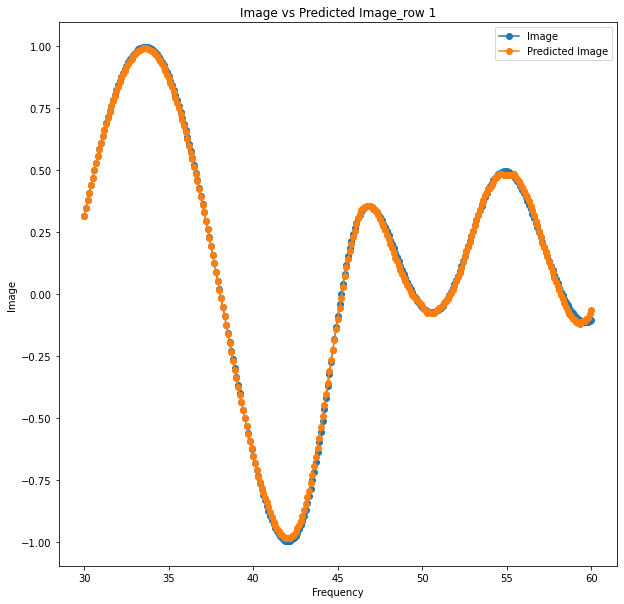

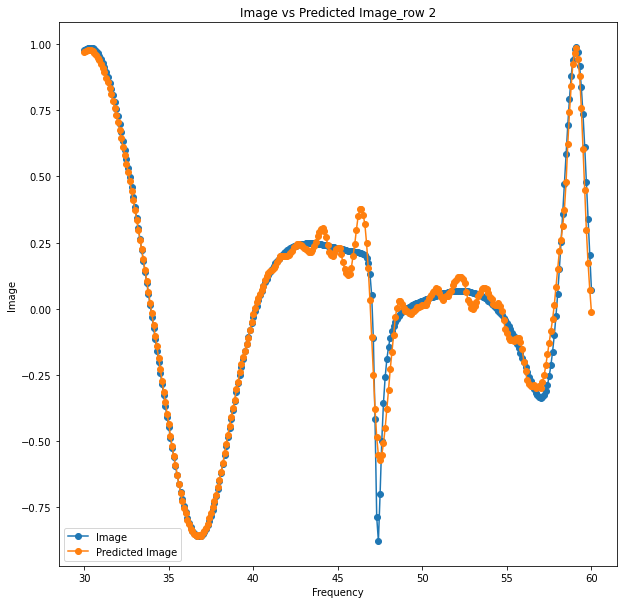

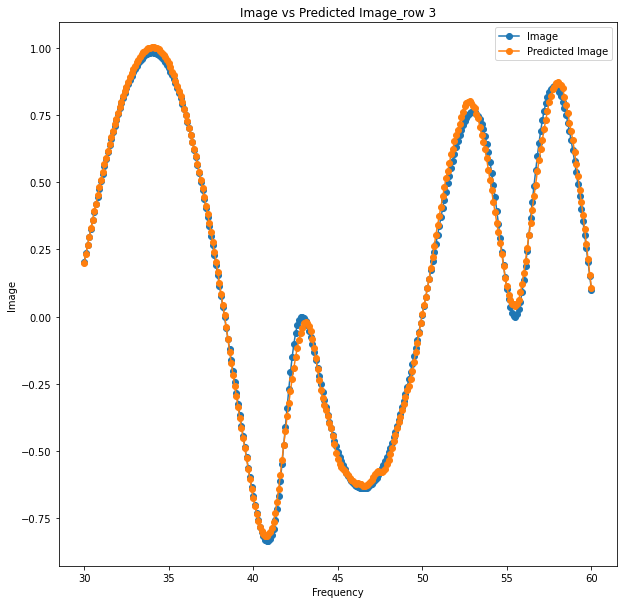

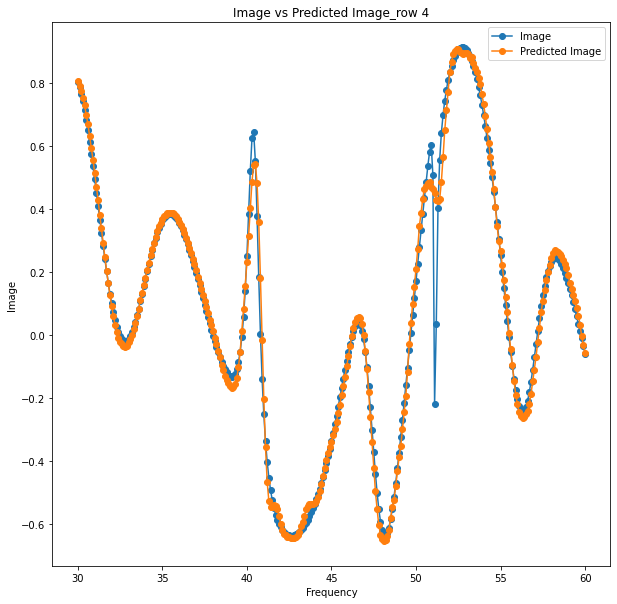

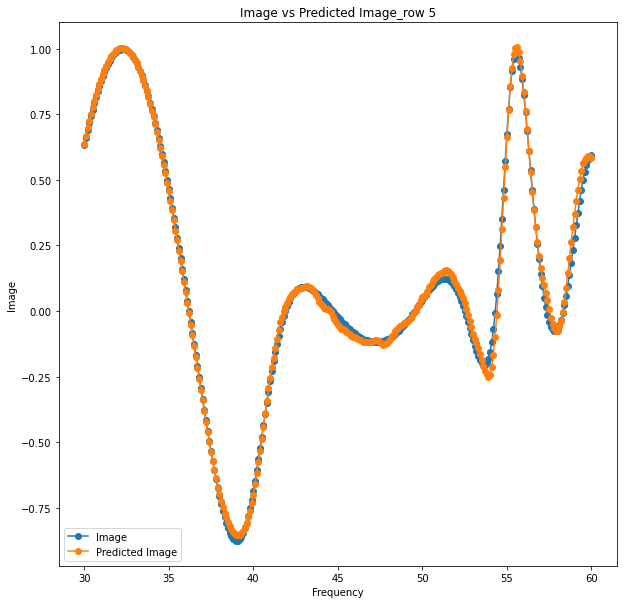

...

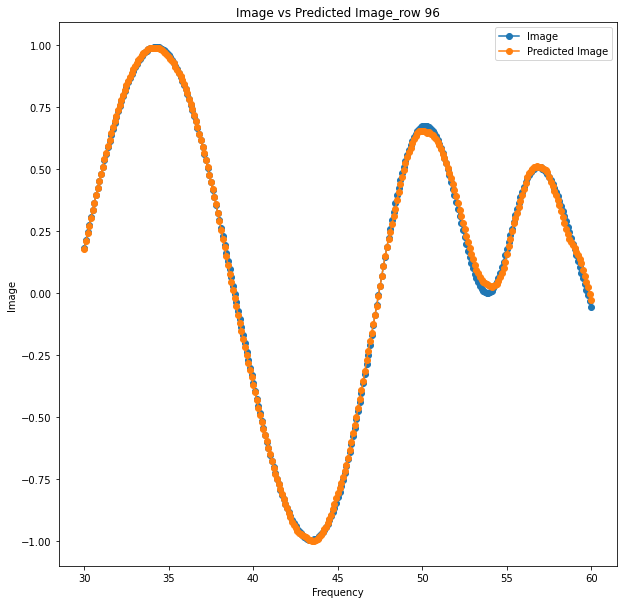

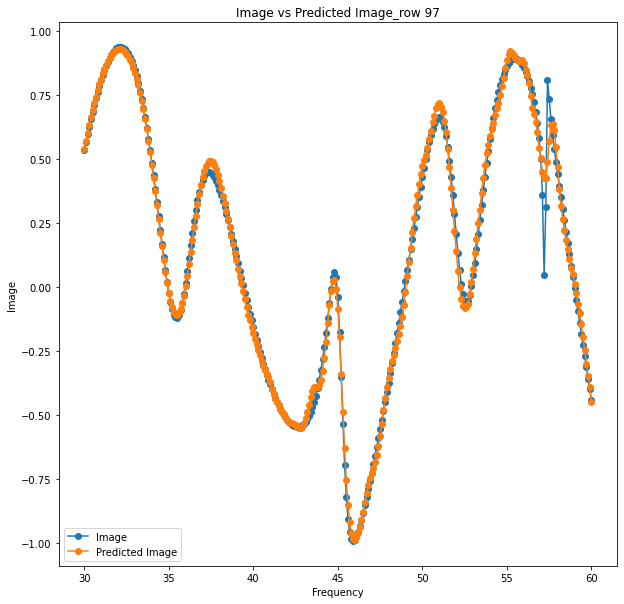

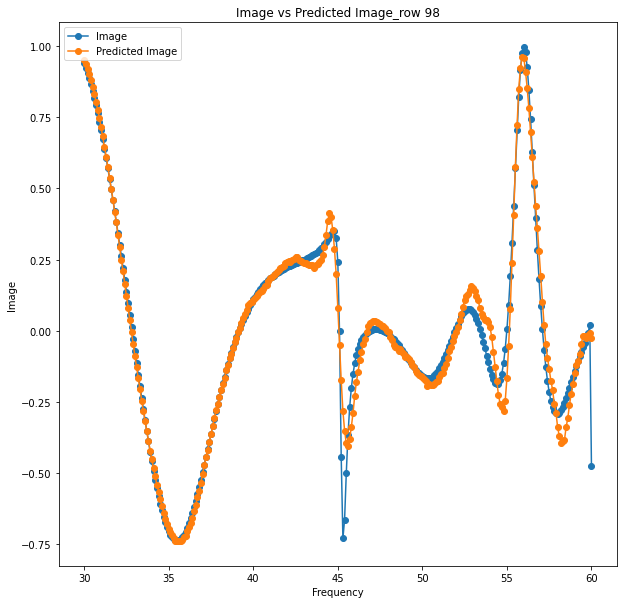

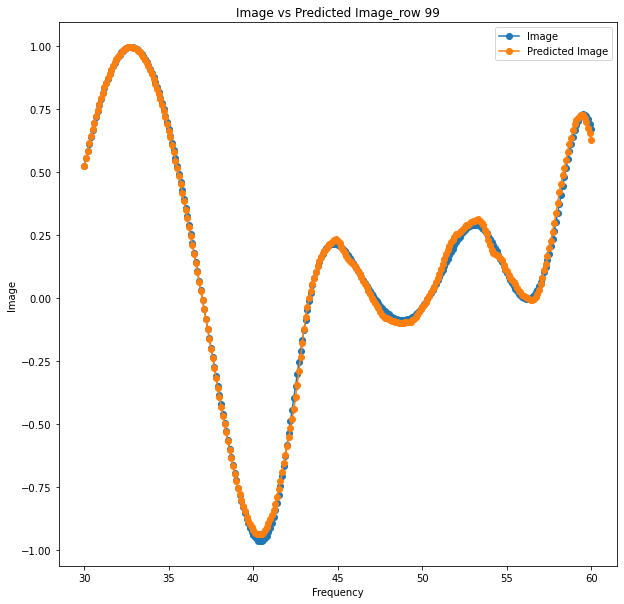

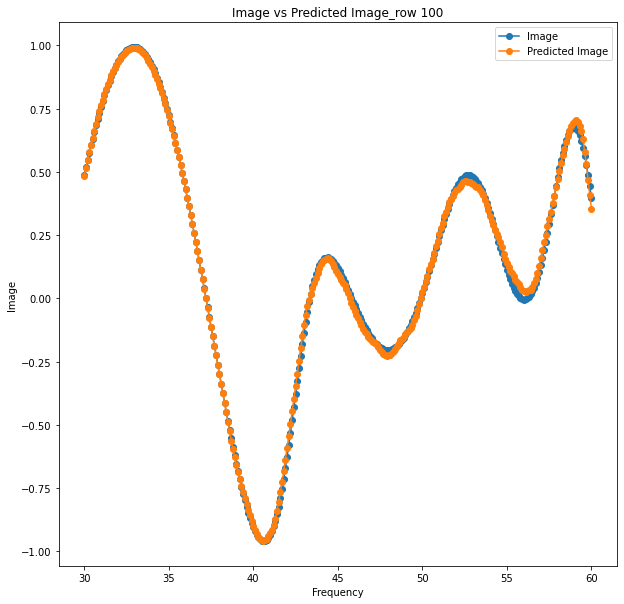

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# create dataloader for parameter and the whole image data
dataset1= torch.utils.data.TensorDataset(x_full, imag_full)   
dataset_imag=SpectroData(dataset1)
dataloader_imag = torch.utils.data.DataLoader(dataset_imag, batch_size=200, shuffle=False, num_workers=0, pin_memory=False) 

#load trained model
PNN_imag, optimizer, start_epoch, r_squared_imag,Trainloss_imag,Testloss_imag,indices_imag = load_ckp(current_checkpoint_PNN_imag, PNN_imag, optimizer)
PNN_imag.eval() #not optimize, evaluate the trained model
with torch.no_grad(): # stop updating the parameters
     for batch_idx, (x_batch, y_batch) in enumerate(dataloader_real):
         y_pred_batch = PNN_real(x_batch)
          #combine all y_pred_batch into pred_imag
         if batch_idx==0: 
            pred_imag=y_pred_batch
         else:
            pred_imag= torch.cat((pred_imag, y_pred_batch),0)
pred_imag_np=pred_imag.cpu().numpy() #convert to numpy
imag_full_np=imag_full.cpu().numpy()


#plot Image vs Predicted Image
#save the first 100 plots into one pdf file
from matplotlib.backends.backend_pdf import PdfPages
from google.colab import files
k=100  
frequency=np.arange(30, 60.1, 0.1) 
pdf = PdfPages('Image vs Predicted Image_first 100 rows.pdf')
for i in range(100): 
        fig, ax = plt.subplots(figsize=(10, 10))
        plt.plot(frequency,imag_full_np[i,], '-o')  # the ith row of all real data
        plt.plot(frequency,pred_imag_np[i,], '-o')# the ith row of the predicted real data
        plt.xlabel('Frequency')
        plt.ylabel('Image')
        plt.legend(['Image','Predicted Image'])
        plt.title('Image vs Predicted Image_row %i'%(i+1))
        pdf.savefig(fig)
        plt.show()

files.download("Image vs Predicted Image_first 100 rows.pdf") 

pdf.close()


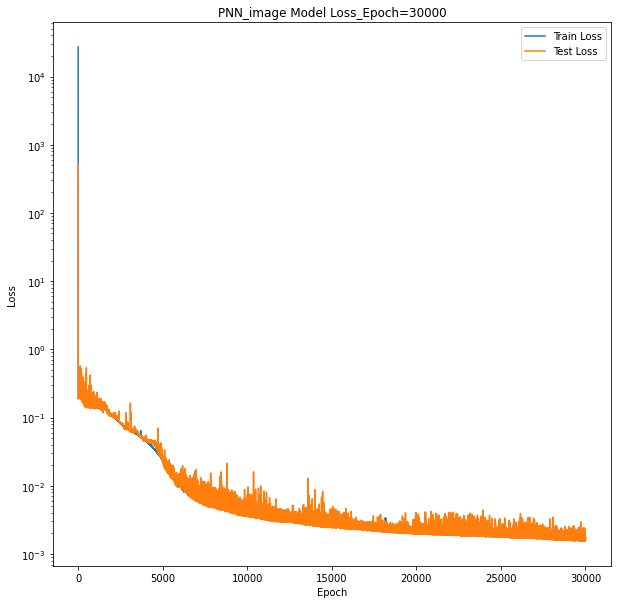

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#plot the model loss
from matplotlib.backends.backend_pdf import PdfPages
from google.colab import files
pdf = PdfPages('PNN_image Model Loss.pdf')
fig, ax = plt.subplots(figsize=(10, 10))

plt.yscale('log') #change the y-axis  scale to logarithmic
k=num_epoch # plot Model loss until kth iteration

plt.plot(Trainloss[0:k])
plt.plot(Testloss[0:k])
 
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train Loss','Test Loss'])
plt.title('PNN_image Model Loss_Epoch=%i'%k )
#plt.savefig("Model Loss_Epoch="+str(k)+ ".png")
pdf.savefig(fig)
plt.show()

files.download("PNN_image Model Loss.pdf") 
pdf.close()


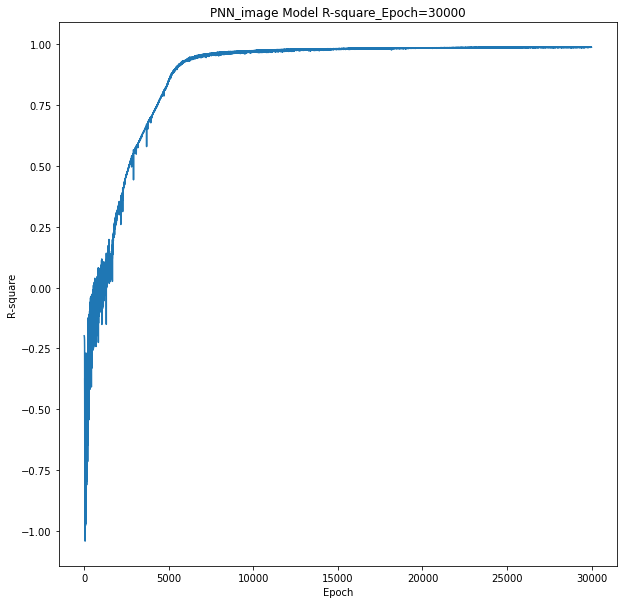

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#plot the model R-square
from matplotlib.backends.backend_pdf import PdfPages
from google.colab import files
pdf = PdfPages('PNN_image Model R-square.pdf')
fig, ax = plt.subplots(figsize=(10, 10))

k=num_epoch # plot Model loss until kth iteration

plt.plot(r_squared[10:k])
 
plt.xlabel('Epoch')
plt.ylabel('R-square')
plt.title('PNN_image Model R-square_Epoch=%i'%k )
#plt.savefig("Model Loss_Epoch="+str(k)+ ".png")
pdf.savefig(fig)
plt.show()

files.download("PNN_image Model R-square.pdf") 
pdf.close()


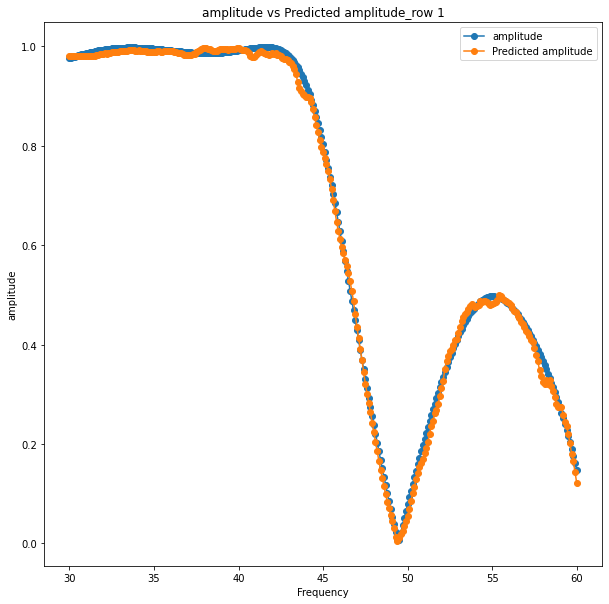

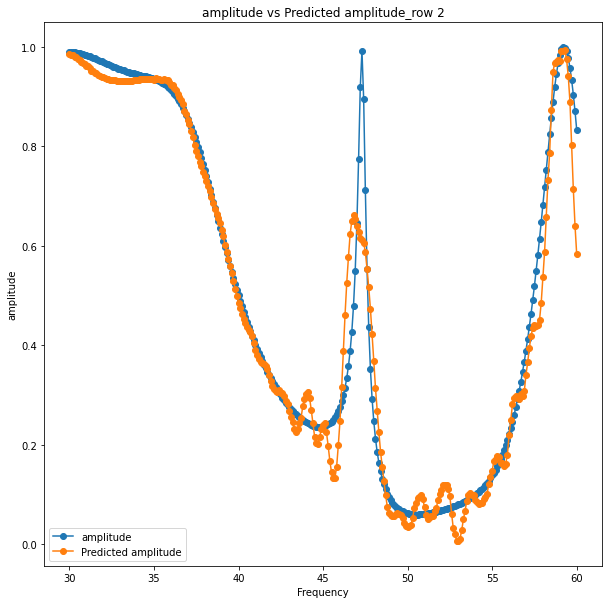

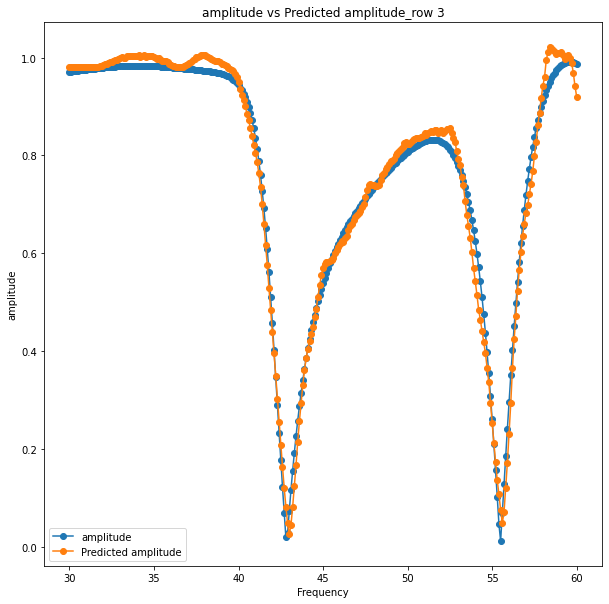

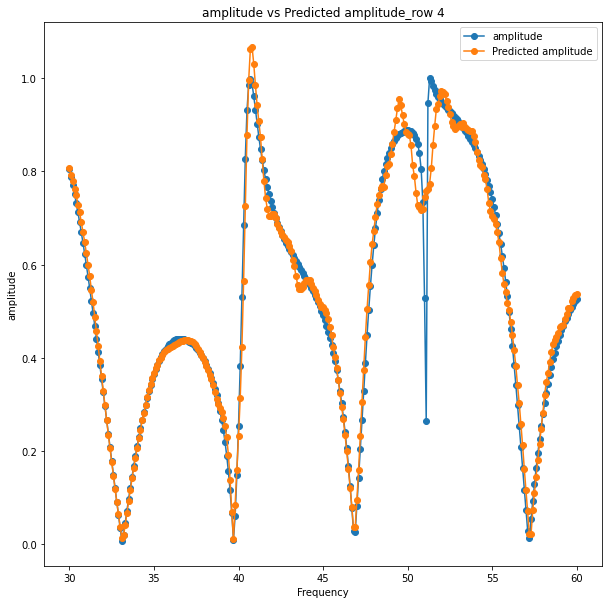

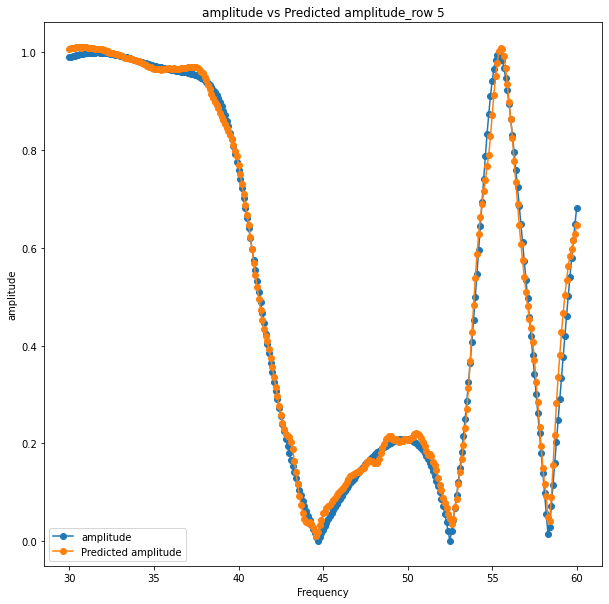

...

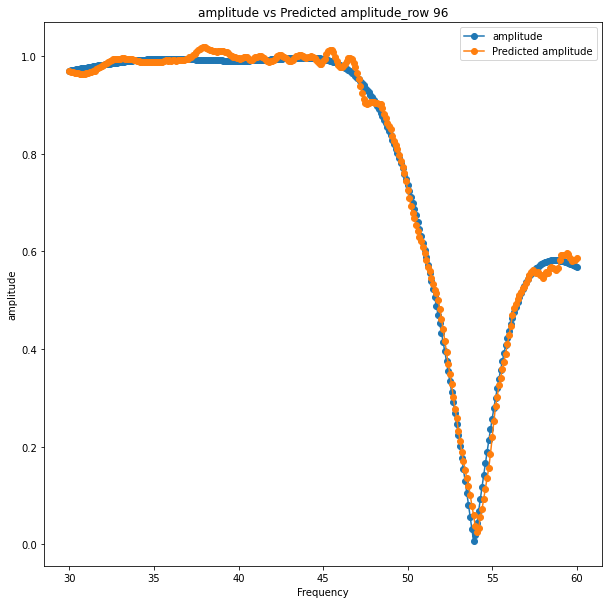

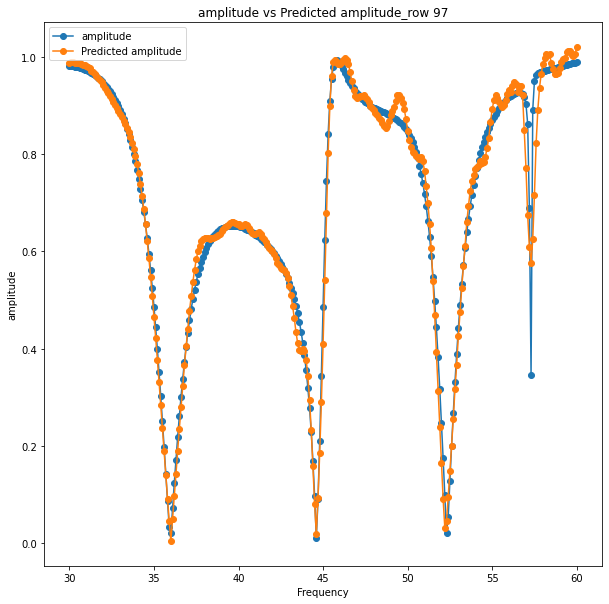

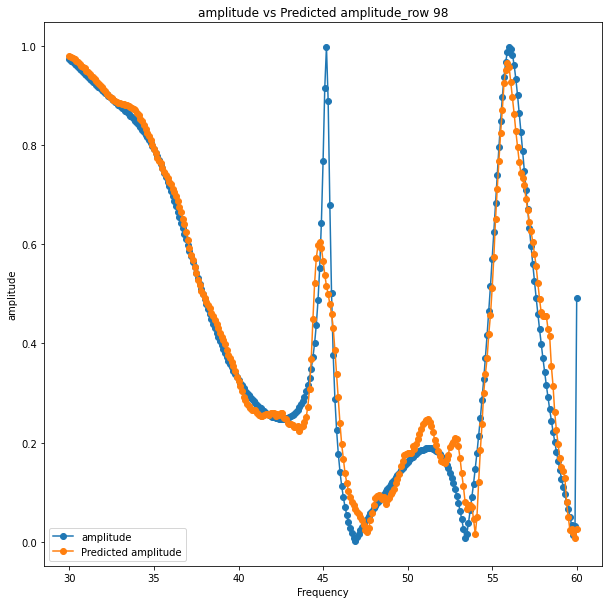

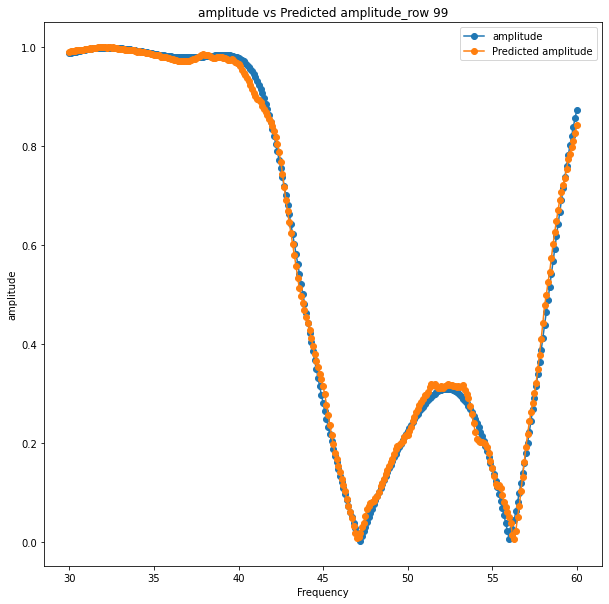

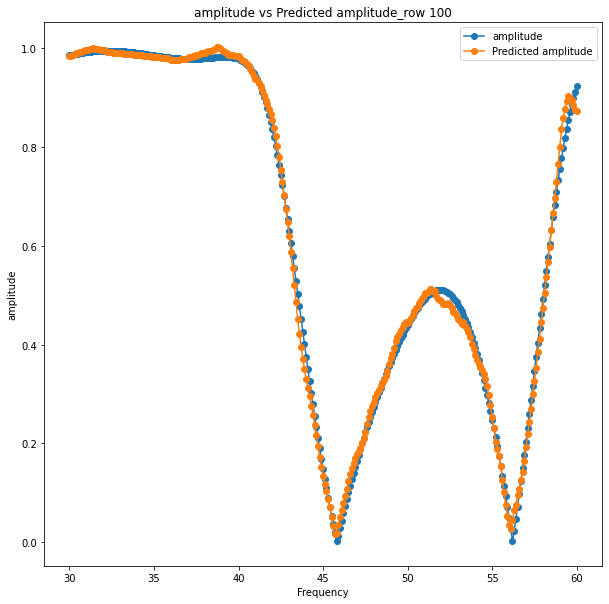

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#plot amplitude vs Predicted amplitude
#save the first 100 plots into one pdf file
from matplotlib.backends.backend_pdf import PdfPages
from google.colab import files
amplitude_full_np=np.sqrt(np.square(real_full_np)+np.square(imag_full_np))
amplitude_pred_np=np.sqrt(np.square(pred_real_np)+np.square(pred_imag_np))

frequency=np.arange(30, 60.1, 0.1) 
pdf = PdfPages('amplitude vs Predicted amplitude_first 100 rows.pdf')
for i in range(k): 
        fig, ax = plt.subplots(figsize=(10, 10))
        plt.plot(frequency,amplitude_full_np[i,], '-o')  # the ith row of all real data
        plt.plot(frequency,amplitude_pred_np[i,], '-o')# the ith row of the predicted real data
        plt.xlabel('Frequency')
        plt.ylabel('amplitude')
        plt.legend(['amplitude','Predicted amplitude'])
        plt.title('amplitude vs Predicted amplitude_row %i'%(i+1))
        pdf.savefig(fig)
        plt.show()

files.download("amplitude vs Predicted amplitude_first 100 rows.pdf") 

pdf.close()